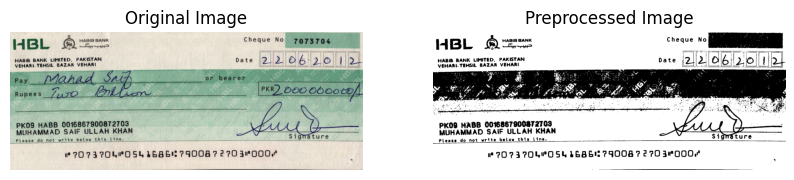

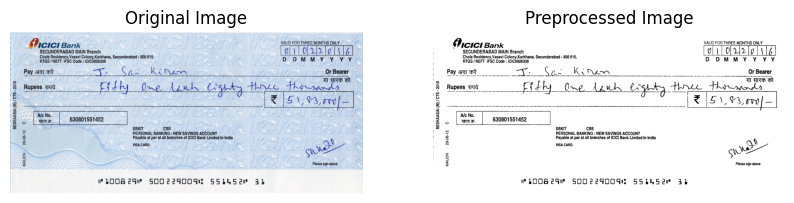

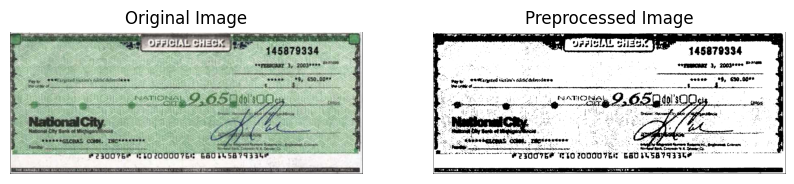

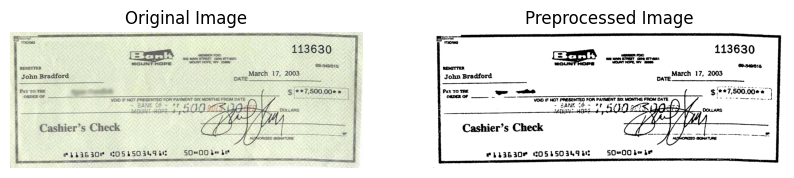

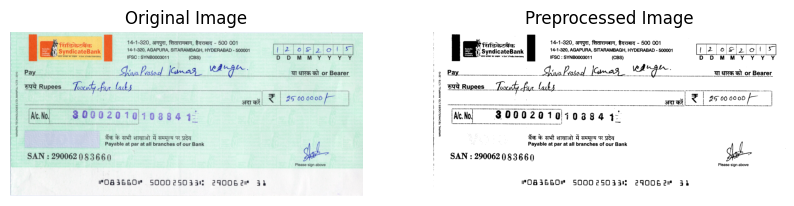

...

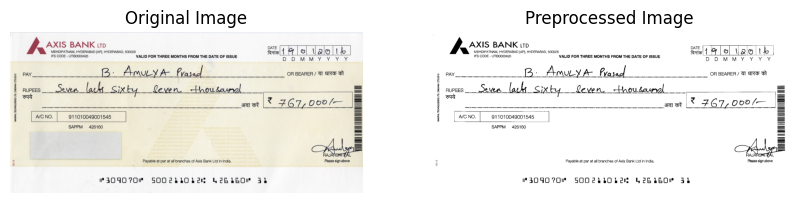

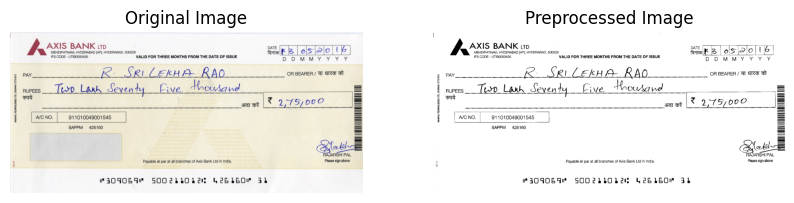

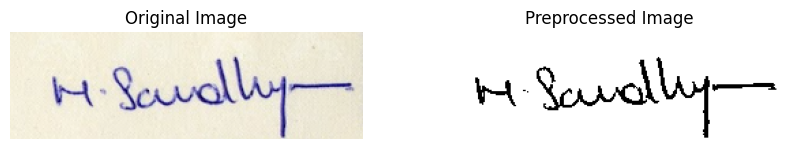

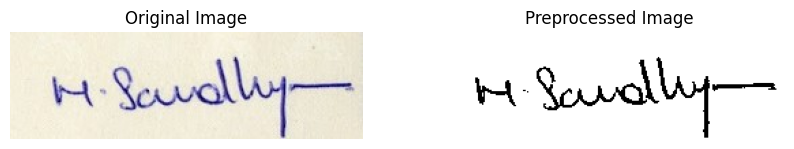

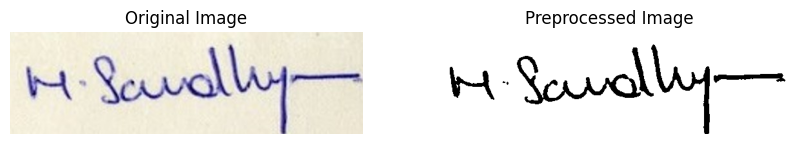

In [1]:
import cv2
import os
import matplotlib.pyplot as plt

def preprocess_check(image_path, output_folder):
    # Reading the original image
    original_image = cv2.imread(image_path)

    # Converting the image to grayscale
    gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

    # Apply Otsu's thresholding
    _, thresholded_image = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Saving the preprocessed image
    filename = os.path.basename(image_path)
    output_path = os.path.join(output_folder, filename)
    cv2.imwrite(output_path, thresholded_image)

    return original_image, thresholded_image

# Path to the directory containing the bank cheque images
folder_path = "/content/drive/MyDrive/Colab Notebooks/TrainSet/z"

# Creating a directory to store preprocessed images
output_folder = "preprocessed_checks"
os.makedirs(output_folder, exist_ok=True)

# Iterate through each image in the folder
for filename in os.listdir(folder_path):
    image_path = os.path.join(folder_path, filename)
    # Ensure the path is a file and ends with .jpeg or .png
    if os.path.isfile(image_path) and (filename.endswith(".jpeg") or filename.endswith(".png")):
        original_image, preprocessed_image = preprocess_check(image_path, output_folder)

        # Display original and preprocessed images side by side
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axes[0].set_title('Original Image')
        axes[0].axis('off')
        axes[1].imshow(preprocessed_image, cmap='gray')
        axes[1].set_title('Preprocessed Image')
        axes[1].axis('off')
        plt.show()

In [2]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [3]:
!pip install pytesseract
!sudo apt-get install tesseract-ocr
!sudo apt-get install libtesseract-dev

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 38 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (6,222 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [4]:
import cv2
import os
import re
import string
import pytesseract
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Function to extract text from an image using OCR
def extract_text_from_image(image_path):
    # Loading the image
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Perform OCR to extract text
    extracted_text = pytesseract.image_to_string(gray_image)

    return extracted_text

# Function to preprocess text
def preprocess_text(text):
    # Convert text to lowercase
    text = text.lower()

    # Remove numbers
    text = re.sub(r'\d+', '', text)

    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))

    # Tokenize text
    tokens = word_tokenize(text)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens if word not in stop_words]

    # Lemmatize words
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(word) for word in filtered_tokens]

    # Reconstruct the preprocessed text
    preprocessed_text = ' '.join(lemmatized_tokens)

    return preprocessed_text

# Path to the directory containing the cheque images
images_dir = "/content/drive/MyDrive/Colab Notebooks/TrainSet/X"

# Iterate over each image in the directory
for filename in os.listdir(images_dir):
    image_path = os.path.join(images_dir, filename)

    # Check if the file is an image
    if os.path.isfile(image_path) and (filename.endswith(".jpeg") or filename.endswith(".png")):
        # Extract text from the image
        extracted_text = extract_text_from_image(image_path)

        # Preprocess the extracted text
        preprocessed_text = preprocess_text(extracted_text)

        # Print the preprocessed text
        print(f"Image: {filename}\nPreprocessed Text: {preprocessed_text}\n")


Image: X_104.jpeg
Preprocessed Text: manipal technology ltd chennai ct mehdipatnam hyderabad ap hyderabad ifs code utibo valid three month date issue axis bank ltd date ferre la jin lee dd mein ney ‘ vea pay bearer ong rupee te lab ssty thowroudl ory sal hy avc sappm wm rawelly co rajarshi pal payable par branch axis bank ltd india please sign mauukw sooecklobon geelbow ab

Image: X_089.jpeg
Preprocessed Text: manipal technology ltd chennai ct rupee ory axis bank tp mehdipatnam hyderabad ap hyderabad ifs code utibo ac sappm valid three month date issue el suthaledee bh payable par branch axis bank ltd india tir cbbobecn l anies oo nee date yy bearer ut org ol rajarshi pal please sign lz sr

Image: X_106.jpeg
Preprocessed Text: manipal technology ltd chennai ct axis bank tp ou fre mehdipatnam hyderabad ap hyderabad ifs code utibo valid three month date issue rok phon rog okie lil ale rupee ae yow orsah ane aolqlzelt ee pay ac sappm mn cyudhy rajarshi pal payable par branch axis bank ltd

In [5]:
!pip install easyocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 24.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 48.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 62.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 76.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━

In [6]:
import cv2
import os
import easyocr

# Function to extract handwritten text from an image using EasyOCR
def extract_handwritten_text(image_path):
    # Initialize EasyOCR reader
    reader = easyocr.Reader(['en'], gpu=False)

    # Read the image and extract text
    result = reader.readtext(image_path)

    # Extract the recognized text
    recognized_text = ' '.join([text[1] for text in result])

    return recognized_text

# Path to the directory containing the cheque images
images_dir = "/content/drive/MyDrive/Colab Notebooks/TrainSet/z"

# List to store the names of the selected images
selected_images = []

# Iterate over the images in the directory and select the first three images
for filename in os.listdir(images_dir)[:3]:  # Select the first three images
    image_path = os.path.join(images_dir, filename)

    # Checking if the file is an image
    if os.path.isfile(image_path) and (filename.endswith(".jpeg") or filename.endswith(".png")):
        selected_images.append(filename)  # Append the filename to the list

# Processing each selected image
for selected_image in selected_images:
    image_path = os.path.join(images_dir, selected_image)

    # Extracting handwritten text from the image
    handwritten_text = extract_handwritten_text(image_path)

    # Print the extracted handwritten text
    print(f"Image: {selected_image}\nExtracted Handwritten Text: {handwritten_text}\n")


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Image: X_048.jpeg
Extracted Handwritten Text: HABIB BANK cheque No 7073704 HBL 445 HABiB BANK Limited, PAKISTAN Da te 2 2 6 VEHARI-Tehsil BAZAR VEHARI Pay Manad or bearer 4 Rupee s Zuo Ezzn PKRZ2 0o Pkog HABB 0016867900872703 y MUHAMMAD SAIF ULLAH KHAN P l eas e do not Vrite be L ou this line S ignature "'?0?3?04/'054 6BE4:?9008 ? 2?03/'000, CX 4B 0a



Image: X_060.jpeg
Extracted Handwritten Text: VALID FOR THREE MONTHS ONLY ICICI Bank SECUNDERABAD MAIN Branch 0/ 22 /v Chola Residency Vasavi Colony Karkhana, Secunderabad - 500 015. RTGS / NEFT IFSC Code : ICICO006308 D D M MY 3Ta Saz KLm Or Bearer 41 MRT 8 Rupees 594 ELlHy O~e Azkh 288 #x + 8 3 }51,83,00/ Alc No: I TTal $ 630801551452 SBKIT CBS PERSONAL BANKING NEW SAVINGS ACCOUNT 1 Payable at par at all branches of ICICI Bank Limited in India VISA CARD { Please sign above I" 1008 291' 500 229009": 55145 Zi" 3} Pay ShLQ

Image: X_005.jpeg
Extracted Handwritten Text: OFFiceL cheek 145879334 L7n TUR 3, 200}**4* aaaeaen ", 650.00t# Relai Jese LQ6sndL.mQ Aabone Naaalt Bonk oltctagan 2 WGIDEAL Co. 4C" 2300761 #O 20000764 680 1L 58793 city Oh



In [7]:
import cv2
import os
import easyocr
import re

# Function to extract handwritten text from an image using EasyOCR
def extract_handwritten_text(image_path):
    # Initialize EasyOCR reader
    reader = easyocr.Reader(['en'], gpu=False)  # Use GPU if available for faster processing

    # Read the image and extract text
    result = reader.readtext(image_path)

    # Extract the recognized text
    recognized_text = ' '.join([text[1] for text in result])

    return recognized_text

# Function to extract handwritten text after "PAY" and before "OR"
def extract_text_between_pay_and_or(text):
    # Use regular expression to extract text between "PAY" and "OR"
    match = re.search(r'PAY\s*(.*?)\s*OR', text, re.IGNORECASE)
    if match:
        return match.group(1).strip()
    else:
        return None

# Path to the directory containing the cheque images
images_dir = "/content/drive/MyDrive/Colab Notebooks/TrainSet/z"

# List to store the names of the selected images
selected_images = []

# Iterate over the images in the directory and select the last five images
for filename in sorted(os.listdir(images_dir))[-5:]:  # Select the last five images
    image_path = os.path.join(images_dir, filename)

    # Check if the file is an image
    if os.path.isfile(image_path) and (filename.endswith(".jpeg") or filename.endswith(".png")):
        selected_images.append(filename)  # Append the filename to the list

# Process each selected image
for selected_image in selected_images:
    image_path = os.path.join(images_dir, selected_image)

    # Extract handwritten text from the image
    handwritten_text = extract_handwritten_text(image_path)

    # Extract text between "PAY" and "OR"
    extracted_text = extract_text_between_pay_and_or(handwritten_text)

    # Print the extracted text
    if extracted_text:
        print(f"Image: {selected_image}\nExtracted Handwritten Text (Between 'PAY' and 'OR'): {extracted_text}\n")
    else:
        print(f"Image: {selected_image}\nNo handwritten text found between 'PAY' and 'OR'.\n")


Image: X_082.jpeg
Extracted Handwritten Text (Between 'PAY' and 'OR'): TT . TRLpuRA AedpY



Image: X_083.jpeg
Extracted Handwritten Text (Between 'PAY' and 'OR'): R SRL LEkHA RAo



Image: X_084.jpeg
Extracted Handwritten Text (Between 'PAY' and 'OR'): B3: AmULYA Pxasad



Image: pic1.jpeg
No handwritten text found between 'PAY' and 'OR'.

Image: pic11.jpeg
No handwritten text found between 'PAY' and 'OR'.



Pair 1:
Similarity Score: [[0.64118355]]
Match


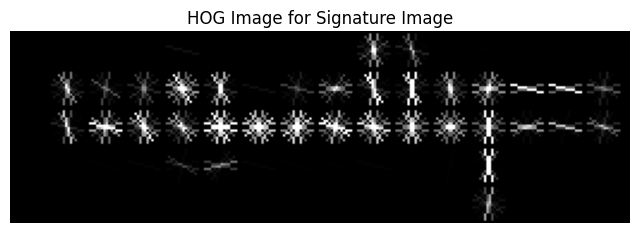

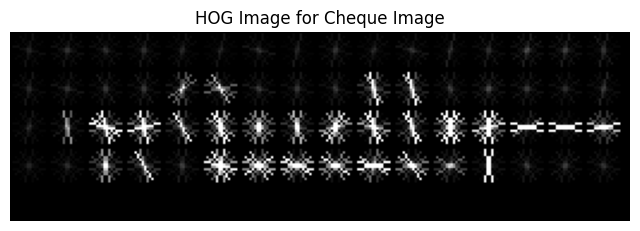

Pair 2:
Similarity Score: [[0.54423859]]
Mismatch


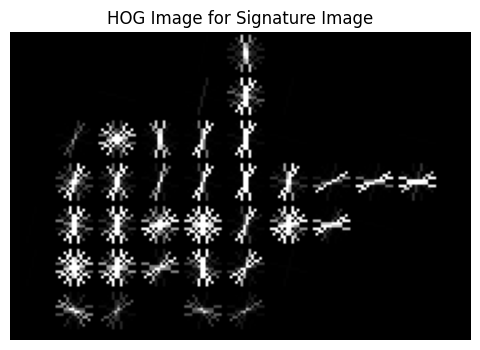

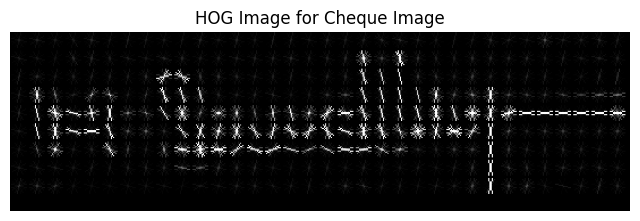

Pair 3:
Similarity Score: [[0.60959667]]
Match


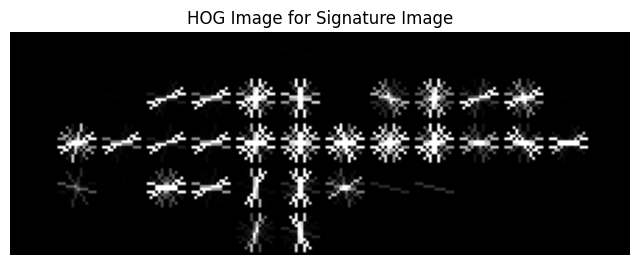

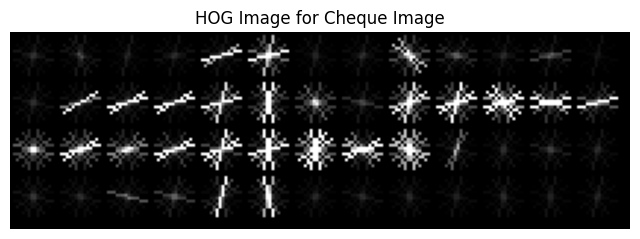

In [8]:
import cv2
from skimage.feature import hog
from skimage import exposure
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity

def extract_signature_region(cheque_image):
    signature_region = cheque_image[100:300, 200:400]
    return signature_region

def extract_features(signature_image):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(signature_image, cv2.COLOR_BGR2GRAY)

    # Compute HOG features
    features, hog_image = hog(gray_image, orientations=8, pixels_per_cell=(16, 16),
                              cells_per_block=(1, 1), visualize=True)

    # Enhance the HOG image for visualization
    hog_image = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    return features, hog_image

# paths to the cheque and signature images
image_pairs = [
    ("/content/drive/MyDrive/Colab Notebooks/TrainSet/X/pic1.jpeg", "/content/drive/MyDrive/Colab Notebooks/TrainSet/y/pic2.jpeg"),
    ("/content/drive/MyDrive/Colab Notebooks/TrainSet/X/pic11.jpeg", "/content/drive/MyDrive/Colab Notebooks/TrainSet/y/other.jpeg"),
    ("/content/drive/MyDrive/Colab Notebooks/TrainSet/X/pic3.jpeg", "/content/drive/MyDrive/Colab Notebooks/TrainSet/y/pic4.jpeg")
]

# Loop over each image pair
for idx, (cheque_image_path, signature_image_path) in enumerate(image_pairs, start=1):
    print(f"Pair {idx}:")
    # Load the images
    cheque_image = cv2.imread(cheque_image_path)
    signature_image = cv2.imread(signature_image_path)

    if cheque_image is None:
        print(f"Error: Unable to load cheque image at {cheque_image_path}")
        continue
    if signature_image is None:
        print(f"Error: Unable to load signature image at {signature_image_path}")
        continue

    # Extract features for the signature image
    signature_image_features, hog_image_signature = extract_features(signature_image)

    # Extract the signature region from the cheque image
    signature_region = extract_signature_region(cheque_image)

    # Extract features for the cheque image
    cheque_image_features, hog_image_cheque = extract_features(cheque_image)

    # Resizing the feature vectors to have the same length
    min_length = min(len(signature_image_features), len(cheque_image_features))
    signature_image_features = signature_image_features[:min_length]
    cheque_image_features = cheque_image_features[:min_length]

    # Compute cosine similarity between features
    similarity = cosine_similarity(signature_image_features.reshape(1, -1), cheque_image_features.reshape(1, -1))

    # Print the similarity score
    print("Similarity Score:", similarity)

    # Define a threshold
    threshold = 0.6

    # Check if the similarity is above the threshold
    if similarity > threshold:
        print("Match")
    else:
        print("Mismatch")

    # Display the HOG image for the signature image
    plt.figure(figsize=(8, 4))
    plt.imshow(hog_image_signature, cmap='gray')
    plt.title("HOG Image for Signature Image")
    plt.axis('off')
    plt.show()

    # Display the HOG image for the cheque image
    plt.figure(figsize=(8, 4))
    plt.imshow(hog_image_cheque, cmap='gray')
    plt.title("HOG Image for Cheque Image")
    plt.axis('off')
    plt.show()


In [9]:
import cv2
import pytesseract

# Function to extract account number from a cheque image
def extract_account_number(image_path):
    # Load the image
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply thresholding to obtain a binary image
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Find contours
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Iterate through contours to find the account number region
    for contour in contours:
        # Get the bounding box of the contour
        x, y, w, h = cv2.boundingRect(contour)

        # Check if the contour satisfies certain criteria (adjust as needed)
        if w > 100 and h > 20:
            # Crop the region of interest where the account number is located
            account_region = binary[y:y+h, x:x+w]

            # Use OCR to recognize the account number
            account_number = pytesseract.image_to_string(account_region, config='--psm 6 -c tessedit_char_whitelist=0123456789')

            # Check if the extracted text resembles an account number
            if len(account_number) >= 9:  # Adjust as needed
                return account_number.strip()

    # If no account number is found, return None
    return None

# List of image paths
image_paths = [
    "/content/drive/MyDrive/Colab Notebooks/TrainSet/z/X_064.jpeg",
    "/content/drive/MyDrive/Colab Notebooks/TrainSet/z/X_082.jpeg",
    "/content/drive/MyDrive/Colab Notebooks/TrainSet/z/X_081.jpeg",
    "/content/drive/MyDrive/Colab Notebooks/TrainSet/z/X_061.jpeg",
    "/content/drive/MyDrive/Colab Notebooks/TrainSet/z/X_062.jpeg"

    # Add more image paths as needed
]

# Process each image and extract account number
for image_path in image_paths:
    account_number = extract_account_number(image_path)
    if account_number:
        print("Account Number for", image_path, ":", account_number)
    else:
        print("Account number not found in", image_path)


Account Number for /content/drive/MyDrive/Colab Notebooks/TrainSet/z/X_064.jpeg : 630801551452
Account Number for /content/drive/MyDrive/Colab Notebooks/TrainSet/z/X_082.jpeg : 911010049001545
Account Number for /content/drive/MyDrive/Colab Notebooks/TrainSet/z/X_081.jpeg : 911010049001545
Account Number for /content/drive/MyDrive/Colab Notebooks/TrainSet/z/X_061.jpeg : 630801551452
Account Number for /content/drive/MyDrive/Colab Notebooks/TrainSet/z/X_062.jpeg : 630801551452


In [10]:
from PIL import Image

def check_dpi(image_path, required_dpi):
    # Open the image
    with Image.open(image_path) as img:
        # Get the resolution in DPI
        dpi = img.info.get("dpi", (0, 0))
        if dpi[0] < required_dpi or dpi[1] < required_dpi:
            print(f"Image resolution of {image_path} is below the required DPI of {required_dpi}")
        else:
            print(f"Image resolution of {image_path} meets the required DPI of {required_dpi}")

# List of image paths
image_paths = ["/content/drive/MyDrive/Colab Notebooks/TrainSet/X/X_087.jpeg", "/content/drive/MyDrive/Colab Notebooks/TrainSet/X/X_088.jpeg", "/content/drive/MyDrive/Colab Notebooks/TrainSet/X/X_089.jpeg", "/content/drive/MyDrive/Colab Notebooks/TrainSet/X/X_090.jpeg", "/content/drive/MyDrive/Colab Notebooks/TrainSet/X/X_091.jpeg", "/content/drive/MyDrive/Colab Notebooks/TrainSet/X/X_092.jpeg","/content/drive/MyDrive/Colab Notebooks/TrainSet/X/pic5.jpg"]
# Required DPI
required_dpi = 300

# Iterate over each image path
for image_path in image_paths:
    check_dpi(image_path, required_dpi)


Image resolution of /content/drive/MyDrive/Colab Notebooks/TrainSet/X/X_087.jpeg meets the required DPI of 300
Image resolution of /content/drive/MyDrive/Colab Notebooks/TrainSet/X/X_088.jpeg meets the required DPI of 300
Image resolution of /content/drive/MyDrive/Colab Notebooks/TrainSet/X/X_089.jpeg meets the required DPI of 300
Image resolution of /content/drive/MyDrive/Colab Notebooks/TrainSet/X/X_090.jpeg meets the required DPI of 300
Image resolution of /content/drive/MyDrive/Colab Notebooks/TrainSet/X/X_091.jpeg meets the required DPI of 300
Image resolution of /content/drive/MyDrive/Colab Notebooks/TrainSet/X/X_092.jpeg meets the required DPI of 300
Image resolution of /content/drive/MyDrive/Colab Notebooks/TrainSet/X/pic5.jpg is below the required DPI of 300
